In [1]:
%load_ext autoreload
%autoreload 2
import pandas as pd
import numpy as np
from anndata import AnnData
import squidpy as sq
import scanpy as sc
from cellpose import models, io
import matplotlib.pyplot as plt
from modest_image import ModestImage, imshow
from skimage.restoration import inpaint
#%matplotlib widget
import cv2
import torch
from skimage import io, morphology
import skimage.feature as features
from scipy import ndimage
import time
from tqdm.notebook import tqdm
import scipy
import seaborn as sns
import pybasic


import skimage
from skimage.measure import regionprops, regionprops_table, approximate_polygon
from shapely.geometry import Polygon
from shapely.geometry.polygon import LinearRing
import geopandas
import scanpy as sc
import rasterio
from rasterio import features
import shapely
from shapely.geometry import Point, Polygon
import matplotlib
from matplotlib.colors import Normalize

2022-06-23 18:19:59,276 [INFO] WRITING LOG OUTPUT TO /home/lottep/.cellpose/run.log


In [2]:
def BasiCCorrection(path_image=None,I=None):
    
    if I is None:
        I = io.imread(path_image)
    #create the tiles
    
    Tiles=[]
    for i in range(0,int(I.shape[0]/2144)): #over the rows
        for j in range(0,int(I.shape[1]/2144)):
            Temp=I[i*2144:(i+1)*2144,j*2144:(j+1)*2144]
            Tiles.append(Temp)
     #measure the filters       
    flatfield = pybasic.basic(Tiles, darkfield=False,verbosity=False)
    
    tiles_corrected= pybasic.correct_illumination(images_list = Tiles, flatfield = flatfield[0])#, darkfield = darkfield)
    
    # stitch the tiles back together
    Inew=np.zeros(I.shape)
    k=0
    for i in range(0,int(I.shape[0]/2144)): #over the rows
        for j in range(0,int(I.shape[1]/2144)):
                Inew[i*2144:(i+1)*2144,j*2144:(j+1)*2144]=tiles_corrected[k]
                k=k+1
      
    fig,ax =plt.subplots(1,2,figsize=(20,10))
    ax[0].imshow(Inew,cmap='gray')
    ax[1].imshow(I,cmap='gray')
    
    return Inew.astype(np.uint16)

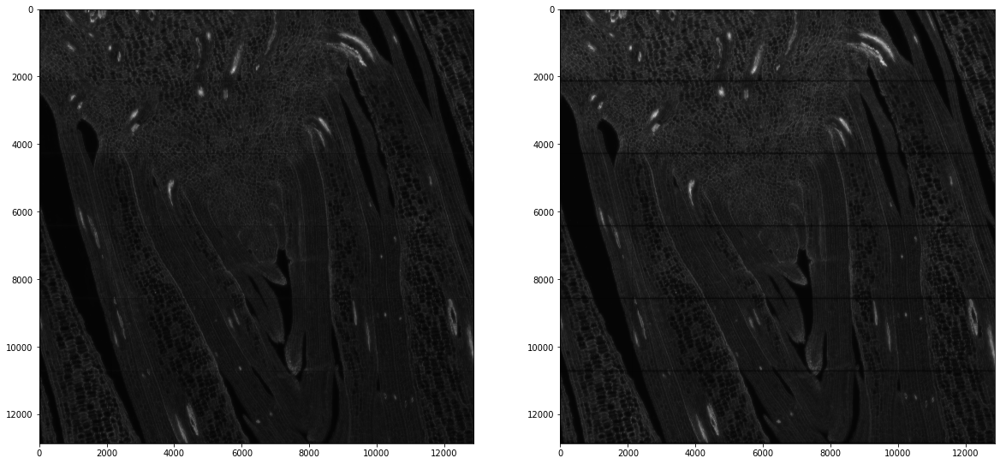

In [3]:
path_image="/srv/scratch/lottep/data/PSB/Resolve data/Hormone dataset/pla1 section (mutant)/C1-2_CalcoF.tiff"
I = io.imread(path_image)
wall=BasiCCorrection(I=I)

In [4]:
def preprocessImage(I=None,path_image=None,contrast_clip=2.5,size_tophat=None,small_size_vis=None):
    "This function performs the prprocessing of an image. If the path_image i provided, the image is read from the path." 
    "If the image I itself is provided, this image will be used."
    "Contrast_clip indiactes the input to the create_CLAHE function for histogram equalization"
    "size_tophat indicates the tophat filter size. If no tophat lfiter size is given, no tophat filter is executes. The recommendable size is 45?-."
    "Small_size_vis indicates the coordinates of an optional zoom in plot to check the processing better."
    t0=time.time()
    #Read in image 
    if I is None:
        I = io.imread(path_image)
    Iorig=I
    
    #mask black lines 
    maskLines=np.where(I == 0) # find the location of the lines 
    mask=np.zeros(I.shape,dtype=np.uint8)
    mask[maskLines[0],maskLines[1]]=1 # put one values in the correct position
    
    # perform inpainting
    res_NS = cv2.inpaint(I, mask, 15, cv2.INPAINT_NS)
    I=res_NS
    
    #tophat filter
    if size_tophat is not None:
        minimum_t = ndimage.minimum_filter(I, size_tophat)  
        orig_sub_min = I - minimum_t
        I=orig_sub_min
    
    #enhance contrast
    clahe = cv2.createCLAHE(clipLimit=contrast_clip, tileGridSize=(8,8))
    I = clahe.apply(I)
    
    #plot_result
    fig,ax =plt.subplots(1,2,figsize=(20,10))
    ax[0].imshow(Iorig,cmap='gray')
    ax[1].imshow(I,cmap='gray')
    
    #plot small part of image
    if small_size_vis is not None:
        fig,ax =plt.subplots(1,2,figsize=(20,10))
        ax[0].imshow(Iorig[small_size_vis[0]:small_size_vis[1],small_size_vis[2]:small_size_vis[3]],cmap='gray')
        ax[1].imshow(I[small_size_vis[0]:small_size_vis[1],small_size_vis[2]:small_size_vis[3]],cmap='gray')
    print(time.time()-t0)    
    return I

19.234904050827026


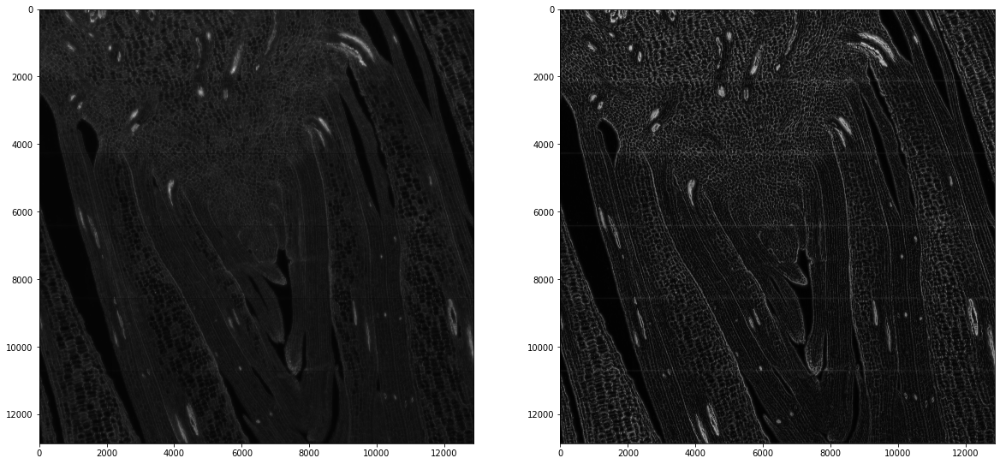

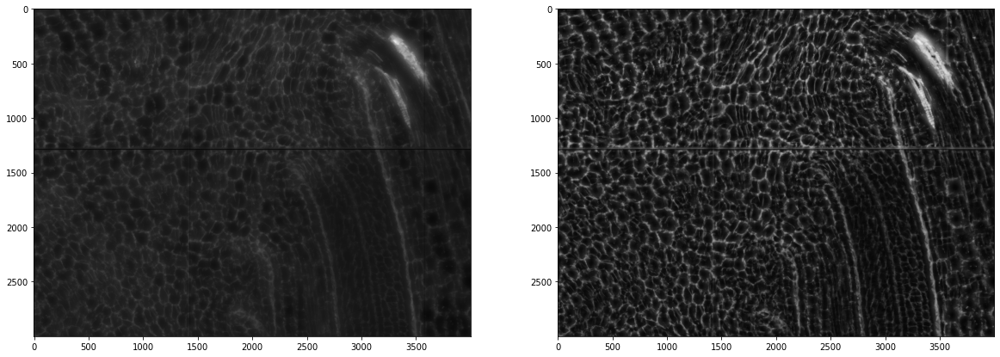

In [10]:
crd=[3000,6000,5000,9000]
IWall=preprocessImage(I=wall,size_tophat=50,small_size_vis=crd,contrast_clip=6.5)

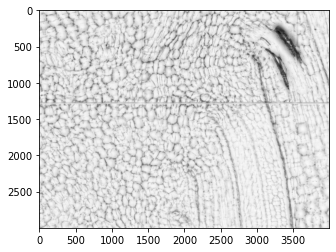

In [11]:
plt.imshow(np.invert(IWall[3000:6000,5000:9000]),cmap='gray')


In [12]:
def segmentation(I,device='cpu',min_size=80,flow_threshold=0.6,diameter=55,mask_threshold=0,small_size_vis=None):
    "This function segments the data, using the cellpose algorithm, and plots the outcome"
    "I is the input image, showing the DAPI Staining, you can define your device by setting the device parameter"
    "min_size indicates the minimal amount of pixels in a mask (I assume)"
    "The lfow_threshold indicates someting about the shape of the masks, if you increase it, more masks with less orund shapes will be accepted"
    "The diameter is a very important parameter to estimate. In the best case, you estimate it yourself, it indicates the mean expected diameter of your dataset."
    "If you put None in diameter, them odel will estimate is herself."
    "mask_threshold indicates how many of the possible masks are kept. MAking it smaller (up to -6), will give you more masks, bigger is less masks. "
    t0=time.time()
    device = torch.device(device) #GPU 4 is your GPU
    model = models.Cellpose(gpu=device, model_type='cyto')
    print(torch.cuda.current_device())
    channels=np.array([0,0])
    torch.cuda.set_device(device)
    masks, flows, styles, diams = model.eval(I,diameter=diameter,channels=channels,min_size=min_size,flow_threshold=flow_threshold,mask_threshold=mask_threshold)
    masksI = np.ma.masked_where(masks == 0, masks)
    Imasked=np.ma.masked_where(I < 500 , I)
    
    #visualization
    
    if small_size_vis is not None:
        fig,ax =plt.subplots(1,2,figsize=(20,10))
        ax[0].imshow(I[small_size_vis[0]:small_size_vis[1],small_size_vis[2]:small_size_vis[3]],cmap='gray')

        ax[1].imshow(I[small_size_vis[0]:small_size_vis[1],small_size_vis[2]:small_size_vis[3]],cmap='gray')
        ax[1].imshow(masksI[small_size_vis[0]:small_size_vis[1],small_size_vis[2]:small_size_vis[3]],cmap='jet')
        plt.show()
    else: 
        fig,ax =plt.subplots(1,2,figsize=(20,10))
        #ax[0].imshow(masks[0:3000,8000:10000],cmap='jet')
        ax[0].imshow(I,cmap='gray')
        #ax[0].imshow(masks,cmap='jet')

        ax[1].imshow(I,cmap='gray')
        ax[1].imshow(masksI,cmap='jet')
        plt.show()
    print(time.time()-t0)
    return masks   


2022-06-23 18:24:47,881 [INFO] ** TORCH CUDA version installed and working. **
2022-06-23 18:24:47,883 [INFO] >>>> using GPU
0
2022-06-23 18:24:47,979 [INFO] ~~~ FINDING MASKS ~~~
2022-06-23 18:28:14,731 [INFO] >>>> TOTAL TIME 206.75 sec


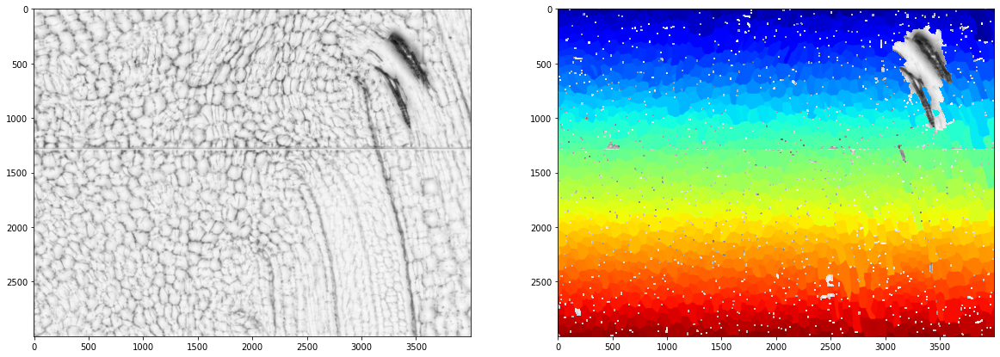

212.14278841018677


In [13]:
Masks=segmentation(np.invert(IWall),device='cuda:0',mask_threshold=-4,flow_threshold=0.9,small_size_vis=crd,min_size=105,diameter=70)

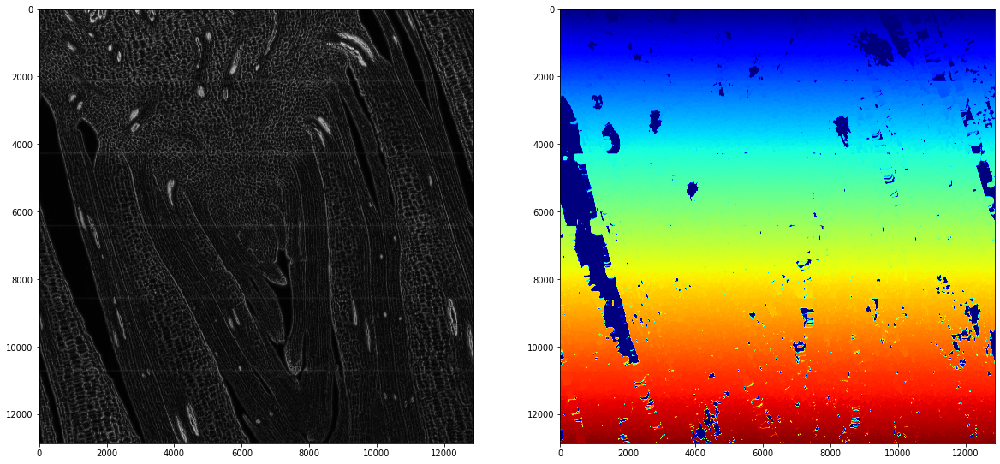

In [14]:
fig,ax =plt.subplots(1,2,figsize=(20,10))
#ax[0].imshow(masks[0:3000,8000:10000],cmap='jet')
ax[0].imshow(IWall,cmap='gray')
masksI = np.ma.masked_where(Masks == 0, Masks)
#ax[0].imshow(masks,cmap='jet')

ax[1].imshow(I,cmap='gray')
ax[1].imshow(Masks,cmap='jet')
plt.show()

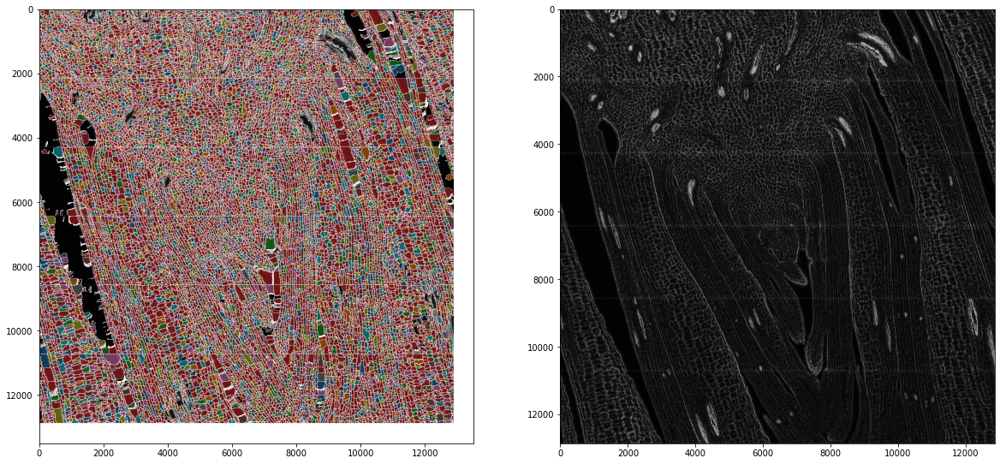

In [15]:
def mask_to_polygons_layer(mask):
    # https://rocreguant.com/convert-a-mask-into-a-polygon-for-images-using-shapely-and-rasterio/1786/
    all_polygons = []
    all_values = []
    for shape, value in features.shapes(mask.astype(np.int16), mask=(mask >0), transform=rasterio.Affine(1.0, 0, 0, 0, 1.0, 0)):
        all_polygons.append(shapely.geometry.shape(shape))
        all_values.append(int(value))

    return geopandas.GeoDataFrame(dict(geometry=all_polygons), index=all_values)
border_margin = 30
w, h = I.shape[0], I.shape[1]

def color(r):
    return plt.get_cmap("Set1")(np.random.choice(np.arange(0, 18)))

def border_color(r):
    return plt.get_cmap("tab10")(3) if r else (1, 1, 1 ,1)

def linewidth(r):
    return 1 if r else 0.5

def is_in_border(r):
    r = r.centroid
    if (r.x - border_margin < 0) or (r.x + border_margin > h):
        return True
    if (r.y - border_margin < 0) or (r.y + border_margin > w):
        return True
    return False

polygons=mask_to_polygons_layer(Masks)
polygons["border"] = polygons.geometry.map(is_in_border)
polygons["border_color"] = polygons.border.map(border_color)
polygons["linewidth"] = polygons.border.map(linewidth)
polygons["color"] = polygons.border.map(color)

fig,ax =plt.subplots(1,2,figsize=(20,10))
ax[0].imshow(IWall,cmap='gray')
polygons.plot(ax=ax[0],column='color',edgecolor='white',linewidth=polygons.linewidth,alpha=0.5)
ax[1].imshow(IWall,cmap='gray')


In [18]:
Ik=io.imread(path_image)[:,:,0]

In [33]:
polygons.cx[10000:12000,5000:10000]

,geometry,border,border_color,linewidth,color
7546,"POLYGON ((10526.000 4901.000, 10540.000 4901.0...",False,"(1, 1, 1, 1)",0.5,"(0.596078431372549, 0.3058823529411765, 0.6392..."
7700,"POLYGON ((11021.000 5006.000, 11021.000 5008.0...",False,"(1, 1, 1, 1)",0.5,"(0.6, 0.6, 0.6, 1.0)"
7700,"POLYGON ((11023.000 5008.000, 11023.000 5011.0...",False,"(1, 1, 1, 1)",0.5,"(0.6, 0.6, 0.6, 1.0)"
7700,"POLYGON ((11026.000 5011.000, 11026.000 5013.0...",False,"(1, 1, 1, 1)",0.5,"(0.6, 0.6, 0.6, 1.0)"
7572,"POLYGON ((9962.000 4920.000, 9969.000 4920.000...",False,"(1, 1, 1, 1)",0.5,"(0.6, 0.6, 0.6, 1.0)"
...,...,...,...,...,...
12685,"POLYGON ((10424.000 8450.000, 10428.000 8450.0...",False,"(1, 1, 1, 1)",0.5,"(0.6, 0.6, 0.6, 1.0)"
12788,"POLYGON ((10715.000 8525.000, 10718.000 8525.0...",True,"(0.8392156862745098, 0.15294117647058825, 0.15...",1.0,"(0.30196078431372547, 0.6862745098039216, 0.29..."
12793,"POLYGON ((10953.000 8532.000, 10970.000 8532.0...",True,"(0.8392156862745098, 0.15294117647058825, 0.15...",1.0,"(0.6, 0.6, 0.6, 1.0)"
12778,"POLYGON ((11910.000 8518.000, 11924.000 8518.0...",True,"(0.8392156862745098, 0.15294117647058825, 0.15...",1.0,"(0.21568627450980393, 0.49411764705882355, 0.7..."


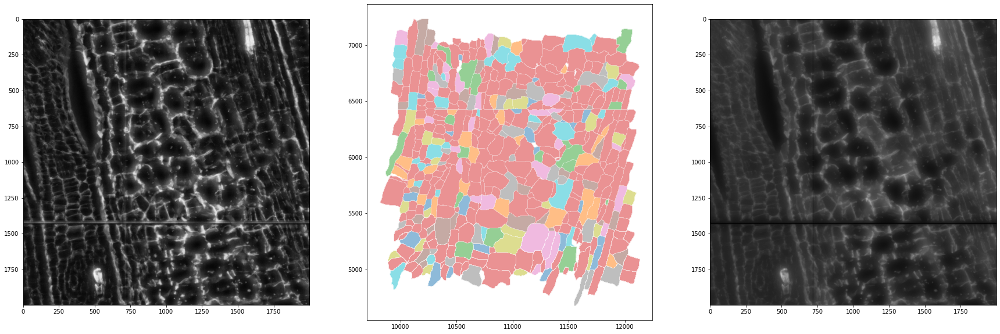

In [16]:
fig,ax =plt.subplots(1,3,figsize=(30,10))
small_size_vis=[5000,7000,10000,12000]
#ax[0].imshow(Masks[small_size_vis[0]:small_size_vis[1],small_size_vis[2]:small_size_vis[3]],cmap='jet')
ax[0].imshow(IWall[small_size_vis[0]:small_size_vis[1],small_size_vis[2]:small_size_vis[3]],cmap='gray')
#ax[1].imshow(IWall[small_size_vis[0]:small_size_vis[1],small_size_vis[2]:small_size_vis[3]],cmap='gray')
subset=polygons.cx[small_size_vis[2]:small_size_vis[3],small_size_vis[0]:small_size_vis[1]]
subset.plot(ax=ax[1],column='color',edgecolor='white',linewidth=polygons.linewidth,alpha=0.5)
ax[2].imshow(I[small_size_vis[0]:small_size_vis[1],small_size_vis[2]:small_size_vis[3]],cmap='gray')

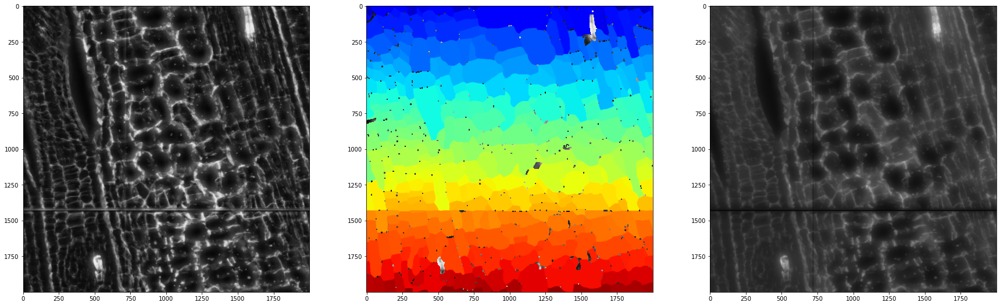

In [17]:
small_size_vis=[5000,7000,10000,12000]
Imasked=np.ma.masked_where(IWall > 500 , IWall)
fig,ax =plt.subplots(1,3,figsize=(30,10))
#ax[0].imshow(Masks[small_size_vis[0]:small_size_vis[1],small_size_vis[2]:small_size_vis[3]],cmap='jet')
ax[0].imshow(IWall[small_size_vis[0]:small_size_vis[1],small_size_vis[2]:small_size_vis[3]],cmap='gray')
ax[1].imshow(IWall[small_size_vis[0]:small_size_vis[1],small_size_vis[2]:small_size_vis[3]],cmap='gray')
ax[1].imshow(masksI[small_size_vis[0]:small_size_vis[1],small_size_vis[2]:small_size_vis[3]],cmap='jet')
ax[2].imshow(I[small_size_vis[0]:small_size_vis[1],small_size_vis[2]:small_size_vis[3]],cmap='gray')
plt.show()

In [18]:
def allocate_genes(path,mask):
    #read in data
    df = pd.read_csv(path, delimiter = "\t",header=None)
    
    #createcKDTree to speed up the process
    nonzero_masks=np.transpose(np.nonzero(mask))
    maskTree=scipy.spatial.cKDTree(nonzero_masks, leafsize=100)
    coordinates_genes=df.iloc[:,[0,1]]
    
    #find the cell for every location
    coordinates_genes=df.iloc[:,[1,0]] # change the order to y,x 
    cells=[]
    distances=[]
    t0=time.time()
    for index,coordinates in tqdm(coordinates_genes.iterrows(),total=coordinates_genes.shape[0]):
        outcome=maskTree.query(coordinates,k=1)#here you can put a cut off for your distance: can't be further than x.
    
        # now you are only looking at one nearest neighbor, two can be interesting. 
        coordinatesC=nonzero_masks[outcome[1]]
        distances.append(outcome[0])
        cell=mask[coordinatesC[0],coordinatesC[1]]
        cells.append(cell)   
    t1=time.time()
    print(t1-t0)
    return df,cells,distances


In [19]:
path_transcripts="/srv/scratch/lottep/data/PSB/Resolve data/Hormone dataset/pla1 section (mutant)/C1-2_results.txt"

In [20]:
df,cells,distances=allocate_genes(path_transcripts,Masks)

  0%|          | 0/2044342 [00:00<?, ?it/s]

195.4275233745575


In [21]:
def create_adata(df,distances,cells,I,filterCrit=None):
    df['cellsR']=cells
    if filterCrit is not None:
        FGenes=[]
        FPositions=[]
        for i,x in enumerate (distances):
            if x>filterCrit: #these cells further away then this distance are filtered out
                FGenes.append(df[3][i])
                FPositions.append(i)

        df=df.drop(FPositions,axis=0)
        print('Done filtering transcripts based on distance')
    coordinates=df.groupby(['cellsR']).mean().iloc[:,[0,1]] #calculate the mean of the transcripts for every cell. Now based on transcripts, better on masks?
    
    cellCounts=df.groupby(['cellsR',3]).size().unstack(fill_value=0) #create a matrix based on counts 
    
    adata = AnnData(cellCounts)
    coordinates.index=coordinates.index.map(str)
    adata.obsm['spatial'] = coordinates
    
    spatial_key = "spatial"
    library_id = "melanoma"
    adata.uns[spatial_key] = {library_id: {}}
    adata.uns[spatial_key][library_id]["images"] = {}
    adata.uns[spatial_key][library_id]["images"] = {"hires": I}
    adata.uns[spatial_key][library_id]["scalefactors"] = {"tissue_hires_scalef": 1, "spot_diameter_fullres": 75}
    return adata    

In [32]:
adata_nuc=create_adata(df,distances,cells,IWall,filterCrit=0)
adata=create_adata(df,distances,cells,IWall,filterCrit=None)

Done filtering transcripts based on distance


/srv/scratch/lottep/anaconda3/envs/try/lib/python3.8/site-packages/anndata/_core/anndata.py:120: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [33]:
def diagnostics(adata_full,adata_filtered):
    print('Of all transcripts, '+str(adata_filtered.X.sum()/adata_full.X.sum())+' is kept.')
    
    Percentages=pd.DataFrame({'Percentage_kept':adata_filtered.X.sum(axis=0)/adata_full.X.sum(axis=0),'tot_counts':adata_filtered.X.sum(axis=0)},index=adata_full.var.index)
    
    adata_F=adata_full[adata_full.obs.index.isin(adata_filtered.obs.index),adata_full.var.index.isin(adata_filtered.var.index)]
    adata_nuc.obs['filtered']=adata_filtered.X.sum(axis=1)/adata_F.X.sum(axis=1)
    
    #fig,ax =plt.subplots(1,1,figsize=(20,10))
    #sc.pl.spatial(adata_nuc,color='filtered',spot_size=70,show=False,cmap='magma',alpha=1,title='Plot showing nucleus density',ax=ax)

    
    return Percentages

In [34]:
diagnostics(adata,adata_nuc)

Of all transcripts, 0.9817726 is kept.


,Percentage_kept,tot_counts
3,,
ABCG36,0.920419,879.0
AFB2,0.963855,80.0
AFB4,0.978041,9977.0
AFB5,0.976303,6015.0
AFB7,0.964063,5258.0
...,...,...
trehalose-6-phosphate_phosphatase4_trpp4,0.966089,1282.0
tsh1,1.000000,113.0
tsh4,0.982362,8020.0


In [35]:
def plot_masks(adata,polygons,column,cmap='magma',alpha=0.5):
    I=adata.uns['spatial']['melanoma']['images']['hires']
    polygonsF=polygons[np.isin(polygons.index.values,list(map(int,adata.obs.index.values)))]
    polygonsF[column]=adata.obs[column].loc[list(map(str,polygonsF.index))].values
    fig,ax =plt.subplots(1,1,figsize=(20,10))
    ax.imshow(I,cmap='gray',)
    polygonsF.plot(ax=ax,column=column,edgecolor='white',linewidth=polygonsF.linewidth,alpha=alpha,legend=True,cmap=cmap)
    #ax[1].imshow(I,cmap='gray',)


In [36]:
def preprocessAdata(adata,mask):
    

    sc.pp.calculate_qc_metrics(adata, inplace=True,percent_top=[2,5])
    fig, axs = plt.subplots(1, 2, figsize=(15, 4))
    sns.distplot(adata.obs["total_counts"], kde=False,ax=axs[0])
    sns.distplot(adata.obs["n_genes_by_counts"], kde=False, bins=55,ax=axs[1])
    sc.pp.filter_cells(adata, min_counts=5) 
    sc.pp.filter_genes(adata, min_cells=5) 
    adata.raw = adata
    
    # nucleusSizeNormalization
    unique, counts = np.unique(mask, return_counts=True)
    nucleusSize=[]
    for i in adata.obs.index:
        nucleusSize.append(counts[int(i)])
    adata.obs['nucleusSize']=nucleusSize 
    adata.X=(adata.X.T/adata.obs.nucleusSize.values).T 
    
    #sc.pp.normalize_total(adata) #This no
    sc.pp.log1p(adata)
    sc.pp.scale(adata, max_value=10)
    sc.tl.pca(adata, svd_solver='arpack',n_comps=20)
    sc.pl.pca(adata, color='total_counts')  
    sc.pl.pca_variance_ratio(adata,n_pcs=50) #lets take 6,10 or 12

    return adata


/srv/scratch/lottep/anaconda3/envs/try/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


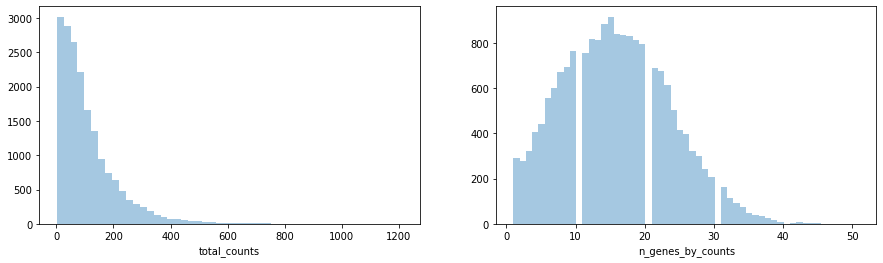

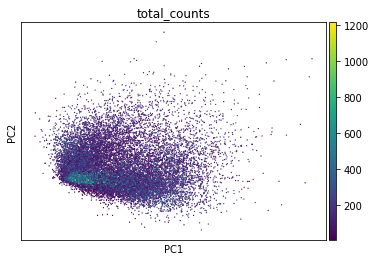

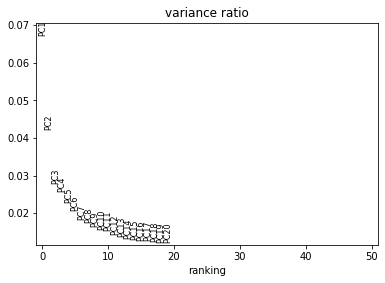

AnnData object with n_obs × n_vars = 17733 × 98
    obs: 'filtered', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_2_genes', 'pct_counts_in_top_5_genes', 'n_counts', 'nucleusSize'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'mean', 'std'
    uns: 'spatial', 'log1p', 'pca'
    obsm: 'spatial', 'X_pca'
    varm: 'PCs'

In [37]:
preprocessAdata(adata_nuc,Masks)

/srv/scratch/lottep/anaconda3/envs/try/lib/python3.8/site-packages/geopandas/geodataframe.py:1456: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


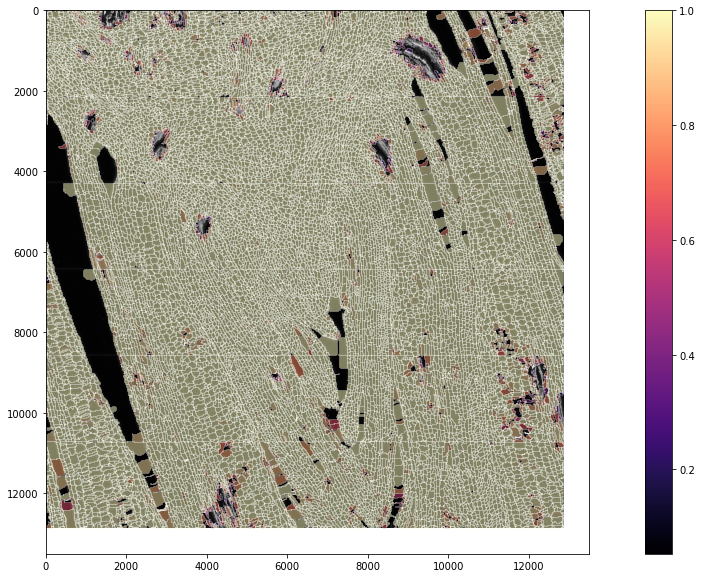

In [28]:
plot_masks(adata_nuc,polygons,'filtered')

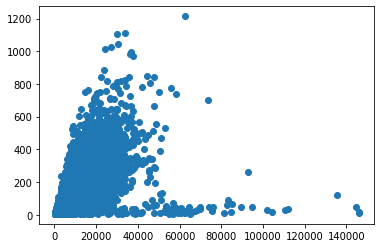

In [29]:
plt.scatter(adata_nuc.obs['nucleusSize'],adata_nuc.obs['total_counts'])

In [38]:
adata_nuc=adata_nuc[adata_nuc.obs['nucleusSize']<60000,:]

/srv/scratch/lottep/anaconda3/envs/try/lib/python3.8/site-packages/geopandas/geodataframe.py:1456: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


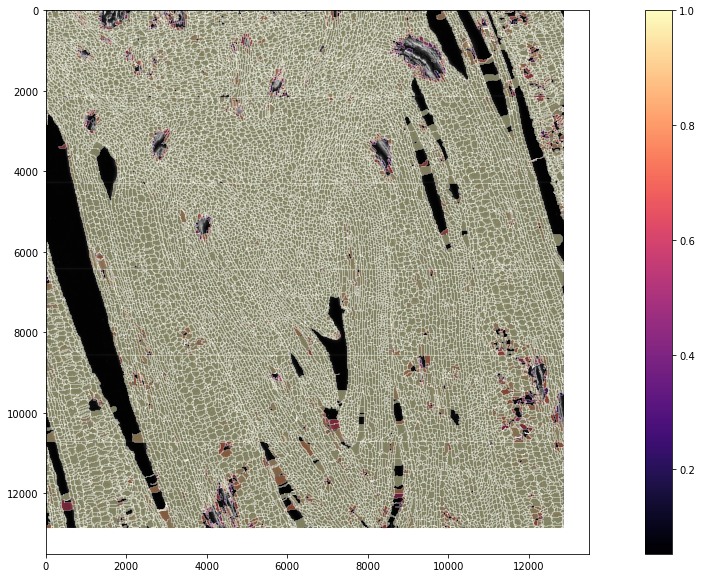

In [39]:
plot_masks(adata_nuc,polygons,'filtered')

In [40]:
np.corrcoef(adata_nuc.obs['nucleusSize'],adata_nuc.obs['total_counts'])

array([[1.        , 0.71015259],
       [0.71015259, 1.        ]])

In [47]:
def preprocess3(adata,pcs,neighbors,spot_size=70):
    
    sc.pp.neighbors(adata, n_neighbors=neighbors, n_pcs=pcs)
    sc.tl.umap(adata)
    #sc.pl.umap(adata, color=['Folr2','Glul','Sox9','Cd9']) #total counts doesn't matter that much
    sc.tl.leiden(adata,resolution=0.8)
    sc.pl.umap(adata, color=['leiden'])
    sc.tl.rank_genes_groups(adata, 'leiden', method='wilcoxon')
    sc.pl.rank_genes_groups(adata, n_genes=8, sharey=False)
    
        
    fig,ax =plt.subplots(1,1,figsize=(20,10))
    sc.pl.spatial(adata,color='leiden',spot_size=spot_size,show=False,cmap='magma',alpha=1,title='Spatial location of clusters',ax=ax)
    return adata

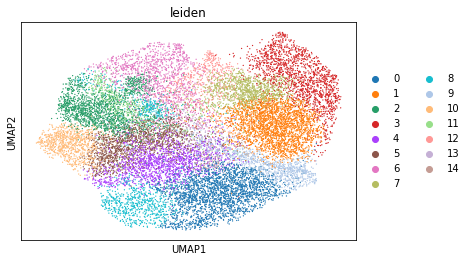

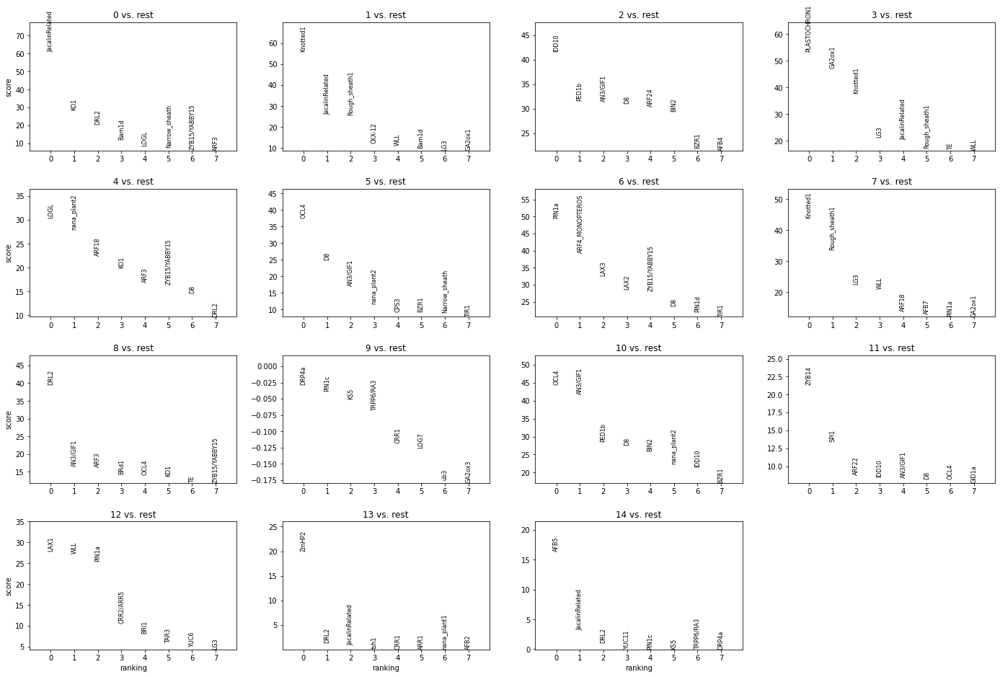

AnnData object with n_obs × n_vars = 17698 × 98
    obs: 'filtered', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_2_genes', 'pct_counts_in_top_5_genes', 'n_counts', 'nucleusSize', 'leiden'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'mean', 'std'
    uns: 'spatial', 'log1p', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'rank_genes_groups'
    obsm: 'spatial', 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

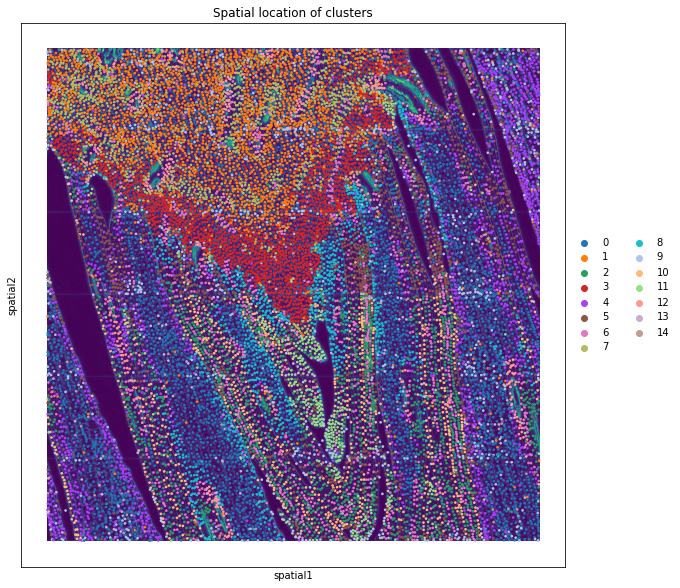

In [48]:
preprocess3(adata_nuc,17,35)

In [49]:
adata_nuc

AnnData object with n_obs × n_vars = 17698 × 98
    obs: 'filtered', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_2_genes', 'pct_counts_in_top_5_genes', 'n_counts', 'nucleusSize', 'leiden'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'mean', 'std'
    uns: 'spatial', 'log1p', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'rank_genes_groups'
    obsm: 'spatial', 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

/srv/scratch/lottep/anaconda3/envs/try/lib/python3.8/site-packages/geopandas/geodataframe.py:1456: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


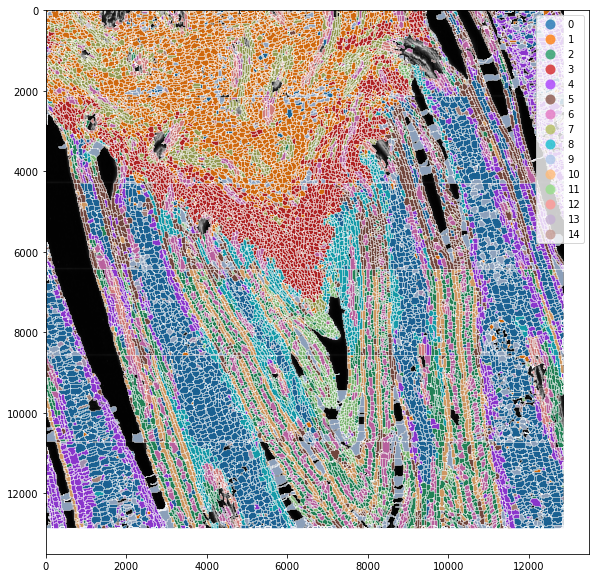

In [50]:
new_map = matplotlib.colors.LinearSegmentedColormap.from_list('new_map',adata_nuc.uns['leiden_colors'], N=len(adata_nuc.uns['leiden_colors']))
plot_masks(adata_nuc,polygons,'leiden',cmap=new_map,alpha=0.8)

In [52]:
adata_nuc.raw.var.index.names=['genes']
adata_nuc.var.index.names=['genes']
adata_nuc.obsm['spatial']=adata_nuc.obsm['spatial'].rename({0: 'X', 1: 'Y'}, axis=1)

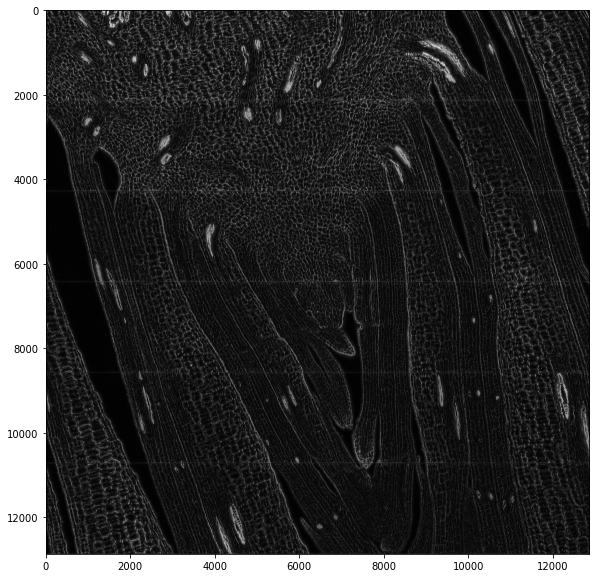

In [51]:
fig,ax =plt.subplots(1,1,figsize=(20,10))
ax.imshow(IWall,cmap='gray')

In [54]:
np.save('/srv/scratch/lottep/data/PSB/Results/adataPSBMutant.npy',Masks)
adata_nuc.write('/srv/scratch/lottep/data/PSB/Results/adataPSBMutant.h5ad')

In [13]:
adata_nuc=sc.read('/srv/scratch/lottep/RESOLVE/Pipeline_Results/adataFilesShort/adataNucPSBPipelinewalls.h5ad')

[<AxesSubplot:title={'center':'Spatial location of clusters'}, xlabel='spatial1', ylabel='spatial2'>]

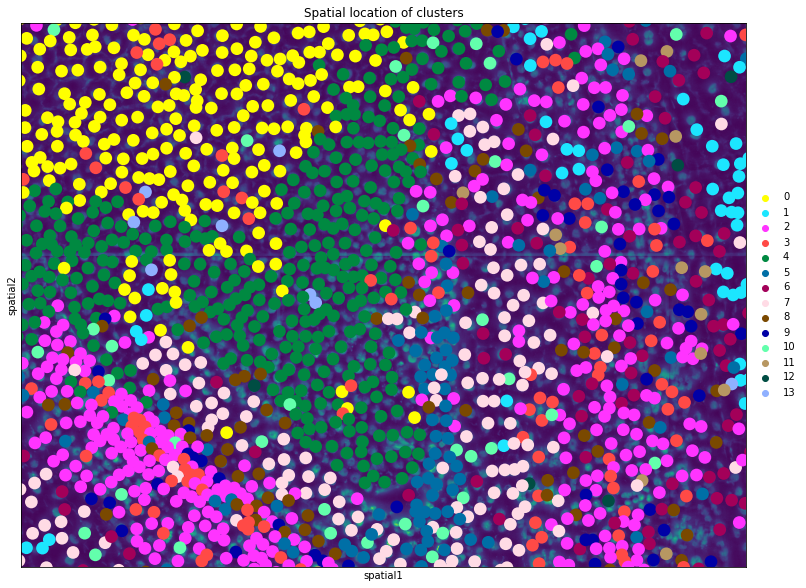

In [24]:
fig,ax =plt.subplots(1,1,figsize=(20,10))
sc.pl.spatial(adata_nuc,color='leiden',spot_size=70,show=False,cmap='magma',alpha=1,title='Spatial location of clusters',ax=ax,crop_coord=[5000,9000,3000,6000])